## Plotting embeddings

In [1]:
import chromadb

# Initialize client and load collection
client = chromadb.PersistentClient(path="radlex_chroma_db")
collection = client.get_collection(name="radlex")

# Retrieve all embeddings and metadata
results = collection.get(include=["embeddings"])
print(results)

embeddings = results['embeddings']

{'ids': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '1

In [2]:
len(embeddings[0])

1024

In [3]:
import json

# Load the RadLex mapping from the JSON file
with open("data/radlex_mappings.json", "r") as f:
    radlex_mappings = json.load(f)

# Assuming you already have this:
# results = {
#     'ids': [...],
#     'embeddings': [...]
# }

# Create a list of labels (codes) for each id in results
labels = [radlex_mappings[id]["code"] if id in radlex_mappings else None for id in results["ids"]]

# Add labels to results
results["labels"] = labels
print(results.keys())


dict_keys(['ids', 'embeddings', 'documents', 'uris', 'included', 'data', 'metadatas', 'labels'])


In [4]:
print(results)

{'ids': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '1

In [5]:
len(results['embeddings'])

45928

In [6]:
from umap import UMAP
import numpy as np

X = np.array(embeddings)
umap = UMAP(n_components=2, random_state=42)
# umap = UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_reduced = umap.fit_transform(X)

/opt/anaconda3/envs/di-lab/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/anaconda3/envs/di-lab/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## Creation of cluster labels based on hierarchical level

In [6]:
import networkx as nx
import pickle

with open("data/RadLex_graph.gpickle", "rb") as f:
    G = pickle.load(f)

G

## Plot of the embeddings

In [7]:
import plotly.express as px
import pandas as pd
import numpy as np

# Example data:
# results["labels"] = ["C849", "A123", "B456", ...]
# X_reduced = np.array([[x1, y1], [x2, y2], ...])

# Extract first letter from each label (handle None values)
first_letters = []

for label in results["labels"]:
    try:
        path = nx.shortest_path(G, source="RID1", target=label)
        if len(path) >= 2:
            # El nodo inmediatamente después de 'RID1'
            first_descendant = path[1]
        else:
            # El nodo es 'RID1' mismo
            first_descendant = "RID1"
    except (nx.NetworkXNoPath, nx.NodeNotFound):
        first_descendant = "Unknown"

    first_letters.append(first_descendant)

In [9]:
# Create a DataFrame for easier plotting
df = pd.DataFrame({
    "x": X_reduced[:, 0],
    "y": X_reduced[:, 1],
    "label": results["labels"],
    "first_letter": first_letters
})

fig = px.scatter(
    df,
    x="x",
    y="y",
    color="first_letter",
    hover_data=["label"],
    title="UMAP of Embeddings Colored by RadLex hierarchy (subclasses of RID1)",
    width=1000, height=600
)

fig.show()

In [8]:
import numpy as np
from sklearn.manifold import TSNE

X = np.array(embeddings)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_embedded = tsne.fit_transform(X)


In [9]:
import pandas as pd

# Map RadLex code (e.g., 'RID21755') → description
code_to_description = {
    entry["code"]: entry["description"] for entry in radlex_mappings.values()
}

# Now, df["label"] should be the actual RadLex code
df = pd.DataFrame({
    "x": X_embedded[:, 0],
    "y": X_embedded[:, 1],
    "label": results["labels"],  # must be e.g., 'RID21755', not numeric IDs
    "first_letter": first_letters
})

# Map labels to descriptions using the actual RadLex codes
df["label_description"] = df["label"].map(code_to_description).fillna("Unknown label")

In [10]:
import json
import pandas as pd
import plotly.express as px

# --- Load RadLex mapping JSON ---
with open("data/radlex_mappings.json") as f:
    raw_mappings = json.load(f)

# Map: {"RIDxxxx": "description"}
radlex_code_to_description = {
    entry["code"]: entry["description"] for entry in raw_mappings.values()
}

# --- Create the DataFrame ---
df = pd.DataFrame({
    "x": X_embedded[:, 0],
    "y": X_embedded[:, 1],
    "label": results["labels"],      # e.g., 'RID12345'
    "first_letter": first_letters    # e.g., 'RID23456'
})

# --- Filter out 'RID1' and 'Unknown' clusters ---
df_filtered = df[~df["first_letter"].isin(["RID1", "Unknown"])].copy()

# --- Map first_letter codes to descriptions ---
def describe(code):
    desc = radlex_code_to_description.get(code, "Unknown")
    return f"{desc} ({code})"

df_filtered["cluster_description"] = df_filtered["first_letter"].apply(describe)

# --- Custom color palette ---
colors = (
    px.colors.qualitative.Plotly +
    px.colors.qualitative.D3 +
    px.colors.qualitative.Dark24 +
    px.colors.qualitative.Light24
)

# --- Plot with first_letter used for grouping, but show descriptive label ---
fig = px.scatter(
    df_filtered,
    x="x",
    y="y",
    color="first_letter",  # cluster grouping
    hover_data=["label"],
    title="t-SNE of Embeddings Colored by RadLex Parent (subclasses of RID1)",
    width=1000,
    height=600,
    color_discrete_sequence=colors,
    labels={"first_letter": "Parent node"},  # Change legend title here
    #size_max=0.2  # Smaller points (default is 15)
)

# --- Replace legend labels with descriptions ---
for trace in fig.data:
    code = trace.name
    if code in df_filtered["first_letter"].values:
        desc = radlex_code_to_description.get(code, "Unknown")
        trace.name = f"{desc} ({code})"
        trace.legendgroup = trace.name
        trace.hovertemplate = trace.hovertemplate.replace(code, trace.name)

# Make points smaller
fig.update_traces(marker=dict(size=4))  # adjust size as needed

fig.write_html("tsne_embeddings_plot.html")
fig.show()

# Computing cluster metrics

In [11]:
import numpy as np

X = np.array(embeddings)

### Silhouette score per cluster

In [12]:
from sklearn.metrics import silhouette_samples
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Your original high-dimensional embeddings (replace with your actual variable)
X_original = X  # e.g., results["embeddings"] or similar

# Use df_filtered because you already filtered out 'RID1' and 'Unknown'
# These are your clusters:
cluster_labels = df_filtered["first_letter"]

# Encode cluster labels to integers
le = LabelEncoder()
cluster_ids = le.fit_transform(cluster_labels)

# Compute per-sample silhouette scores on original embeddings
sample_silhouettes = silhouette_samples(X_original[df_filtered.index], cluster_ids)

# Add silhouette scores and cluster IDs to your filtered dataframe
df_filtered["silhouette"] = sample_silhouettes
df_filtered["cluster_id"] = cluster_ids

# Compute mean silhouette score per cluster (parent node code)
cluster_scores = df_filtered.groupby("first_letter")["silhouette"].mean()

# Convert to DataFrame for easier manipulation
cluster_scores_df = cluster_scores.reset_index()
cluster_scores_df.rename(columns={"first_letter": "parent_node", "silhouette": "mean_silhouette"}, inplace=True)

# Add description from radlex_code_to_description dict
cluster_scores_df["description"] = cluster_scores_df["parent_node"].map(radlex_code_to_description).fillna("Unknown")

# Sort by silhouette descending
cluster_scores_df = cluster_scores_df.sort_values(by="mean_silhouette", ascending=False)

print(cluster_scores_df)

   parent_node  mean_silhouette                description
9     RID49573         0.129599            temporal entity
11    RID50606         0.082435          imaging specialty
3     RID28639         0.025894  RadLex non-anatomical set
14     RID7479         0.009200   non-anatomical substance
5     RID34785         0.008051           clinical finding
6     RID34861         0.003217                     object
2     RID28487         0.000000                     report
13     RID7467        -0.002894             procedure step
1      RID1559        -0.007103                  procedure
4         RID3        -0.009807          anatomical entity
10        RID5        -0.015035        imaging observation
8     RID39128        -0.015928                    process
12        RID6        -0.052561          RadLex descriptor
7     RID35977        -0.057878                   property
0     RID13158        -0.111659           report component


### Measures how similar a point is to its own cluster vs. other clusters.

In [17]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X, first_letters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: -0.015


### Ratio of between-cluster dispersion to within-cluster dispersion

In [18]:
from sklearn.metrics import calinski_harabasz_score

score = calinski_harabasz_score(X, first_letters)
print(f"Calinski-Harabasz Index: {score:.3f}")

Calinski-Harabasz Index: 109.692


### Evaluates intra-cluster vs. inter-cluster similarity

In [19]:
from sklearn.metrics import davies_bouldin_score

score = davies_bouldin_score(X, first_letters)
print(f"Davies-Bouldin Index: {score:.3f}")

Davies-Bouldin Index: 5.824


## Plot of extracted codes for two modality+area report types

In [18]:
!pwd

/Users/3141562lar/Desktop/TUM/2425_SS/DI-LAB/radiology-app/test/RadLex


In [24]:
import pandas as pd
import json

# Load original reports JSON
with open("../../test/icd_coding/data/PARROT_sample_reports/reports_by_modality.json", "r", encoding="utf-8") as f:
    original_reports = json.load(f)

report_meta = {int(item["no"]): {"modality": item["modality"], "area": item["area"]} for item in original_reports}

# Load predictions from Excel file
df = pd.read_excel("data/output/radlex_modality_predictions.xlsx")

df.head()

,Report_no,Modality,Area,Entity,Code,Description,Score
0,15,CT,Head,Posterior fossa,RID35735,posterior cranial fossa,0.245
1,15,CT,Head,Fourth ventricle,RID7147,fourth ventricle,0.028
2,15,CT,Head,Shape,RID28825,morphology,0.108
3,15,CT,Head,Size,RID5774,small,0.374
4,15,CT,Head,Brainstem,RID6677,brainstem,0.050


In [26]:
df.shape

(195, 7)

In [30]:
import numpy as np

# Save X_embedded to a .npy file
np.save("tsne_projection.npy", X_embedded)

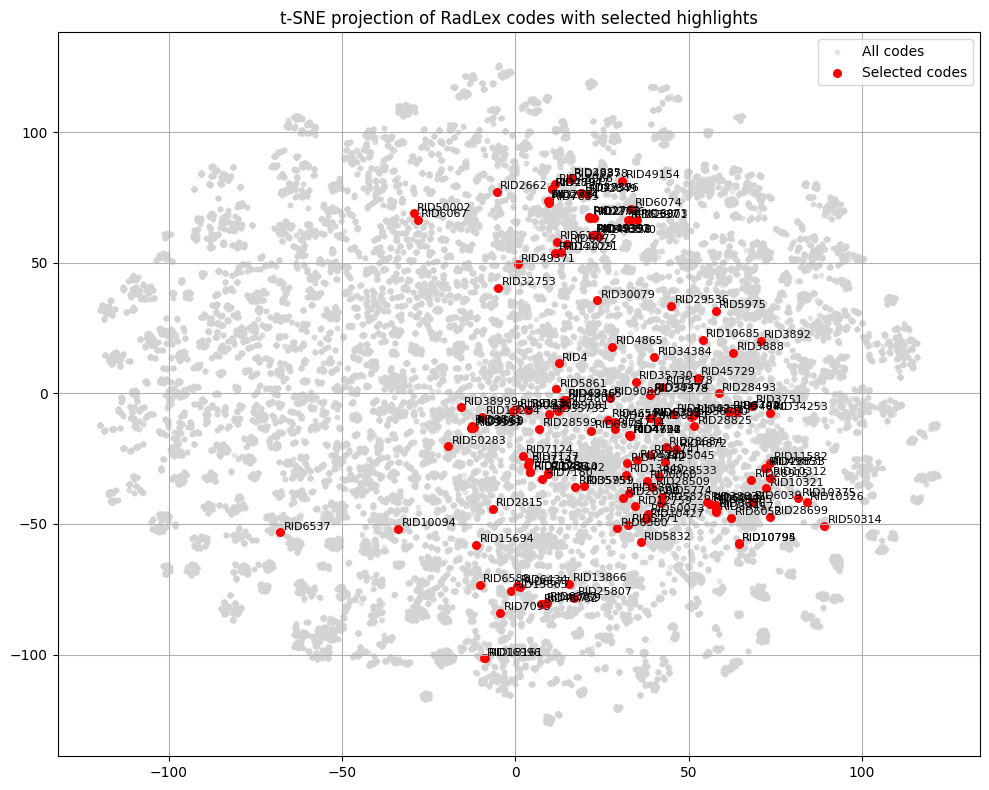

In [34]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load t-SNE projection (n_points x 2)
X_embedded = np.load("tsne_projection.npy")

# Load the mapping from index → code
with open("data/radlex_mappings.json", "r") as f:
    index_to_code = json.load(f)

# Build reverse map: code → index
code_to_index = {v["code"]: int(k) for k, v in index_to_code.items()}

# --- df should already be loaded at this point ---
# Extract the set of codes from the dataframe
highlight_codes = set(df["Code"].unique())

# Find indices in the embedding corresponding to those codes
highlight_indices = [code_to_index[c] for c in highlight_codes if c in code_to_index]

# --- Plotting ---
plt.figure(figsize=(10, 8))

# Plot all points in light grey
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], color="lightgrey", alpha=0.5, s=10, label="All codes")

# Plot highlighted points
highlight_coords = X_embedded[highlight_indices]
plt.scatter(highlight_coords[:, 0], highlight_coords[:, 1], color="red", s=30, label="Selected codes")

# Optionally annotate each highlighted point with the code
for idx in highlight_indices:
    x, y = X_embedded[idx]
    code = index_to_code[str(idx)]["code"]
    plt.text(x + 1, y + 1, code, fontsize=8)

plt.title("t-SNE projection of RadLex codes with selected highlights")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [42]:
import json
import pandas as pd
import numpy as np
import networkx as nx
import plotly.express as px

# --- Load data ---
X_embedded = np.load("tsne_projection.npy")

with open("data/radlex_mappings.json") as f:
    index_to_code = json.load(f)

# Build reverse lookup: code → index
code_to_index = {v["code"]: int(k) for k, v in index_to_code.items()}

# Build code → description mapping
radlex_code_to_description = {v["code"]: v["description"] for v in index_to_code.values()}

# Your dataframe: df (contains Code, Modality, Area, etc.)

# --- Assign categories for selected codes ---
code_labels = {}
for _, row in df.iterrows():
    code = row["Code"]
    modality = row["Modality"]
    area = row["Area"]
    
    if modality == "CT" and area == "Head":
        code_labels[code] = "CT Head"
    elif modality == "MR" and area == "Knee":
        code_labels[code] = "MR Knee"

# Mark all others as "Other"
all_codes = set(radlex_code_to_description.keys())
unlabeled_codes = all_codes - set(code_labels)
for code in unlabeled_codes:
    code_labels[code] = "Other"

# --- Load or build the ontology graph ---
# Assume `G` is your NetworkX DiGraph from RadLex
# Assume `radlex_code_to_description` is available

def get_first_descendant(code):
    try:
        path = nx.shortest_path(G, source="RID1", target=code)
        if len(path) >= 2:
            return path[1]
        else:
            return "RID1"
    except (nx.NetworkXNoPath, nx.NodeNotFound):
        return "Unknown"

def describe(code):
    desc = radlex_code_to_description.get(code, "Unknown")
    return f"{desc} ({code})"

# --- Build plot data ---
plot_data = []
for idx in range(len(X_embedded)):
    code = index_to_code[str(idx)]["code"]
    description = index_to_code[str(idx)]["description"]
    label = code_labels.get(code, "Other")
    
    parent_code = get_first_descendant(code)
    parent_description = describe(parent_code)

    plot_data.append({
        "x": X_embedded[idx, 0],
        "y": X_embedded[idx, 1],
        "code": code,
        "description": description,
        "group": label,
        "parent_info": parent_description
    })

df_plot = pd.DataFrame(plot_data)

# --- Plot with Plotly ---
color_map = {
    "CT Head": "blue",
    "MR Knee": "green",
    "Other": "lightgrey"
}

fig = px.scatter(
    df_plot,
    x="x",
    y="y",
    width=1000,
    height=800,
    color="group",
    color_discrete_map=color_map,
    hover_data={
        "description": True,
        "code": True,
        "parent_info": True,
        "x": False,
        "y": False,
        "group": False
    },
    title="t-SNE Projection of RadLex Codes with Cluster Info"
)

fig.update_traces(marker=dict(size=6, opacity=0.85))
fig.update_layout(legend_title_text="Code Origin")
fig.show()

In [56]:
 import plotly.express as px

# Get unique chapters (cluster descriptions)
unique_clusters = df_selected["cluster_description"].unique()

# Pick a categorical color palette from plotly.express
palette = px.colors.qualitative.Safe  # or any palette you like

# Create a mapping from cluster description to color
color_map = {cluster: palette[i % len(palette)] for i, cluster in enumerate(unique_clusters)}

# Then inside your loop:
for (cluster, shape), group in df_selected.groupby(["cluster_description", "shape"]):
    colors = [color_map[cluster]] * len(group)  # all points in group have the same cluster color

    fig.add_trace(go.Scattergl(
        x=group["x"],
        y=group["y"],
        mode="markers",
        marker=dict(
            size=8,
            symbol=shape,
            color=colors,
            showscale=False
        ),
        name=f"{cluster} ({shape})",
        hovertemplate=(
            "<b>%{customdata[0]}</b><br>" +  # Description
            "RID: %{customdata[1]}<br>" +
            "Chapter: %{customdata[2]}"
        ),
        customdata=group[["description", "code", "cluster_description"]]
    ))

In [62]:
import plotly.graph_objects as go

shape_to_modality_area = {
    "circle": "CT Head",
    "square": "MR Knee"
}

fig = go.Figure()

# Plot unselected codes (grey and transparent)
fig.add_trace(go.Scattergl(
    x=df_unselected["x"],
    y=df_unselected["y"],
    mode="markers",
    marker=dict(color="lightgrey", size=6, opacity=0.3),
    name="Unselected",
    hoverinfo="skip",
    showlegend=True
))

# Plot selected codes, color by cluster_description, shape by shape, legend by cluster + modality_area
for (cluster, shape), group in df_selected.groupby(["cluster_description", "shape"]):
    colors = [color_map[cluster]] * len(group)
    modality_area = shape_to_modality_area.get(shape, "Unknown")
    legend_name = f"{cluster} ({modality_area})"
    
    fig.add_trace(go.Scattergl(
        x=group["x"],
        y=group["y"],
        mode="markers",
        marker=dict(
            size=8,
            symbol=shape,
            color=colors,
            showscale=False
        ),
        name=legend_name,
        hovertemplate=(
            "<b>%{customdata[0]}</b><br>" +  # Description
            "RID: %{customdata[1]}<br>" +
            "Chapter: %{customdata[2]}"
        ),
        customdata=group[["description", "code", "cluster_description"]],
    ))

fig.update_layout(
    title="t-SNE Projection of Selected RadLex Codes",
    legend_title="Chapter + Modality + Area",
    template="simple_white",
    height=700
)

fig.show()

In [51]:
import plotly.graph_objects as go
import plotly.express as px

# 1. Start with unselected points (light grey)
fig = go.Figure()

fig.add_trace(go.Scattergl(
    x=df_unselected["x"],
    y=df_unselected["y"],
    mode="markers",
    marker=dict(color="lightgrey", size=6),
    name="Unselected",
    hoverinfo="skip",
    showlegend=True
))

# 2. Define color palette by chapter
unique_chapters = df_selected["cluster_description"].unique()
color_map = dict(zip(unique_chapters, px.colors.qualitative.Plotly))

# 3. Define shape mapping by modality
shape_map = {
    "CT Head": "circle",
    "MR Knee": "square"
}

# 4. Plot selected codes, grouped by (chapter, modality)
for (chapter, modality), group in df_selected.groupby(["cluster_description", "modality"]):
    fig.add_trace(go.Scattergl(
        x=group["x"],
        y=group["y"],
        mode="markers",
        marker=dict(
            size=8,
            color=color_map[chapter],
            symbol=shape_map.get(modality, "circle")
        ),
        name=f"{chapter} ({modality})",
        customdata=group[["description", "code", "cluster_description"]],
        hovertemplate="<b>%{customdata[0]}</b><br>RID: %{customdata[1]}<br>Chapter: %{customdata[2]}"
    ))

# 5. Layout
fig.update_layout(
    title="t-SNE Projection of Selected RadLex Codes",
    legend_title="Chapter + Modality",
    template="simple_white",
    height=700
)

fig.show()

KeyError: 'modality'